In [1]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Load dataset
df = pd.read_csv('New Dataset.csv')
df.head()

,Country Code,City,Longitude,Latitude,Cuisines,Average Cost for two,Has Table booking,Has Online delivery,Is delivering now,Price range,Aggregate rating,Votes
0,162,Makati City,121.027535,14.565443,"French, Japanese, Desserts",1100,Yes,No,No,3,4.8,314
1,162,Makati City,121.014101,14.553708,Japanese,1200,Yes,No,No,3,4.5,591
2,162,Mandaluyong City,121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Yes,No,No,4,4.4,270
3,162,Mandaluyong City,121.056475,14.585318,"Japanese, Sushi",1500,No,No,No,4,4.9,365
4,162,Mandaluyong City,121.057508,14.584450,"Japanese, Korean",1500,Yes,No,No,4,4.8,229


In [3]:
# Dropping irrelevant columns
df = df.drop(columns=['Has Table booking', 'Has Online delivery', 'Is delivering now', 'Votes', 'Average Cost for two'])
df.head()

,Country Code,City,Longitude,Latitude,Cuisines,Price range,Aggregate rating
0,162,Makati City,121.027535,14.565443,"French, Japanese, Desserts",3,4.8
1,162,Makati City,121.014101,14.553708,Japanese,3,4.5
2,162,Mandaluyong City,121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4,4.4
3,162,Mandaluyong City,121.056475,14.585318,"Japanese, Sushi",4,4.9
4,162,Mandaluyong City,121.057508,14.584450,"Japanese, Korean",4,4.8


In [4]:
# Initializing the map centered on the average latitude and longitude of the restaurants
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

In [5]:
# Adding marker cluster to the map for each restaurant
marker_cluster = MarkerCluster().add_to(restaurant_map)
for index, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['City']} - {row['Cuisines']}\nRating: {row['Aggregate rating']}"
    ).add_to(marker_cluster)

# Visualizing the map
restaurant_map


In [6]:
restaurant_map.save('restaurant_locations.html')

In [7]:
# Grouping by city and aggregating the data
city_stats = df.groupby('City').agg({
    'Latitude': 'count',  
    'Aggregate rating': 'mean',  
    'Price range': 'mean'  
}).rename(columns={'Latitude': 'Restaurant Count'})
print(city_stats)

                 Restaurant Count  Aggregate rating  Price range
City                                                            
Abu Dhabi                      20          4.300000     3.300000
Agra                           20          3.965000     2.650000
Ahmedabad                      21          4.161905     2.571429
Albany                         17          3.552941     1.823529
Allahabad                      20          3.395000     2.650000
...                           ...               ...          ...
Waterloo                       20          3.650000     1.750000
Weirton                         1          3.900000     2.000000
Wellington City                20          4.250000     3.250000
Winchester Bay                  1          3.200000     2.000000
Yorkton                         1          3.300000     2.000000

[140 rows x 3 columns]


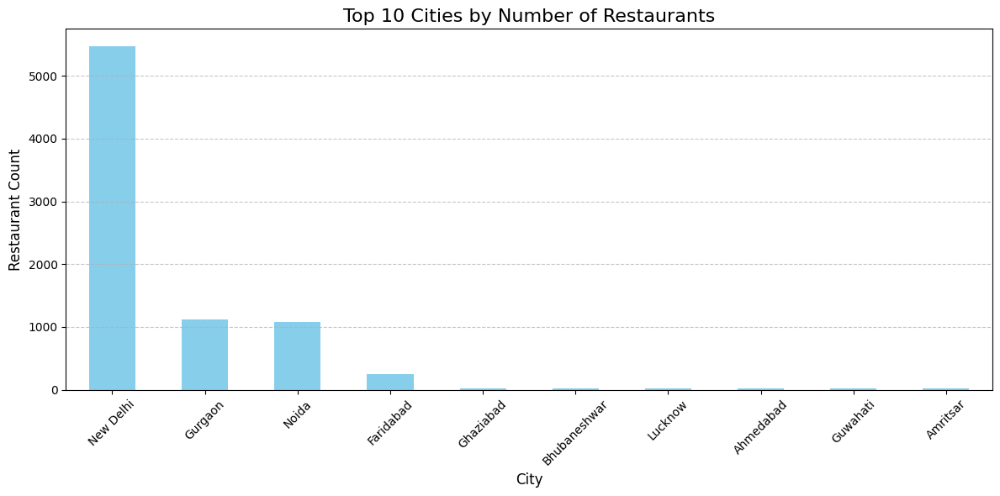

In [8]:
# Sort by restaurant count and select the top 10
top_cities = city_stats['Restaurant Count'].sort_values(ascending=False).head(10)  # Change 10 to 20 for top 20

# Create the barplot to visualize the top cities by restaurant count
plt.figure(figsize=(12, 6))
top_cities.plot(kind='bar', color='skyblue')
plt.title('Top 10 Cities by Number of Restaurants', fontsize=16)
plt.xlabel('City', fontsize=12)
plt.ylabel('Restaurant Count', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

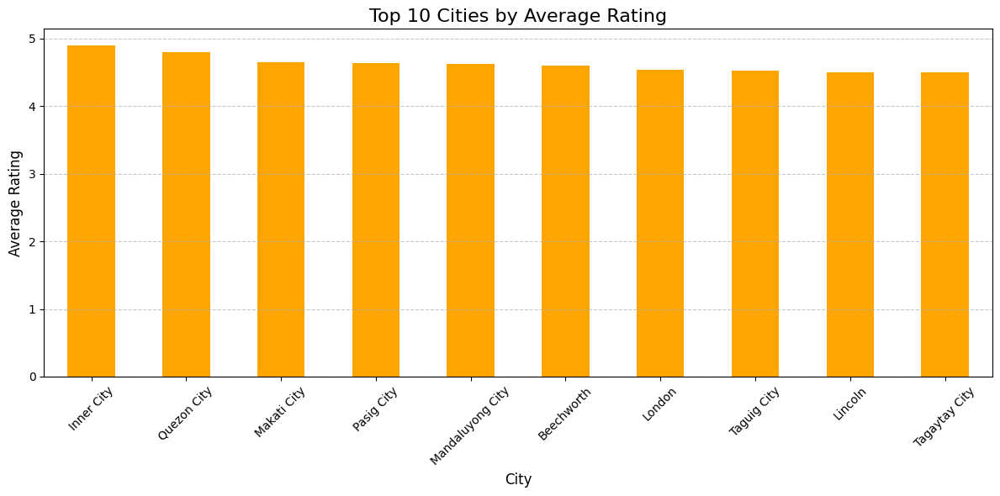

In [9]:
# Sort by average rating and select the top 10
top_rated_cities = city_stats['Aggregate rating'].sort_values(ascending=False).head(10)  # Change to 20 for top 20

# Create the barplot to visualize the top cities by average rating
plt.figure(figsize=(12, 6))
top_rated_cities.plot(kind='bar', color='orange')
plt.title('Top 10 Cities by Average Rating', fontsize=16)
plt.xlabel('City', fontsize=12)
plt.ylabel('Average Rating', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [13]:
cuisines_by_city = df.groupby('City')['Cuisines'].apply(
    lambda x: len(set(', '.join(x).split(', ')))
)

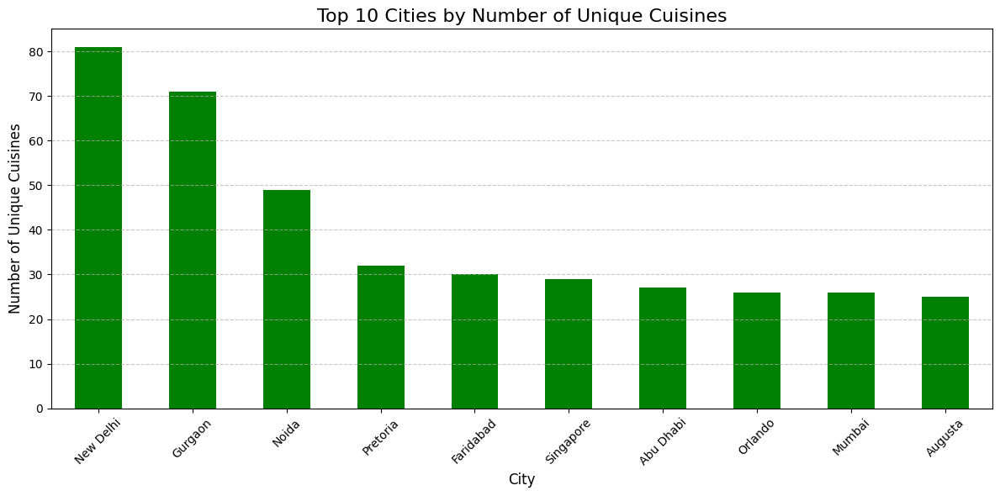

In [14]:
# Sort by number of unique cuisines and select the top 10
top_cuisine_cities = cuisines_by_city.sort_values(ascending=False).head(10)

# Create the barplot to visualize the top cities by number of unique cuisines
plt.figure(figsize=(12, 6))
top_cuisine_cities.plot(kind='bar', color='green')
plt.title('Top 10 Cities by Number of Unique Cuisines', fontsize=16)
plt.xlabel('City', fontsize=12)
plt.ylabel('Number of Unique Cuisines', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

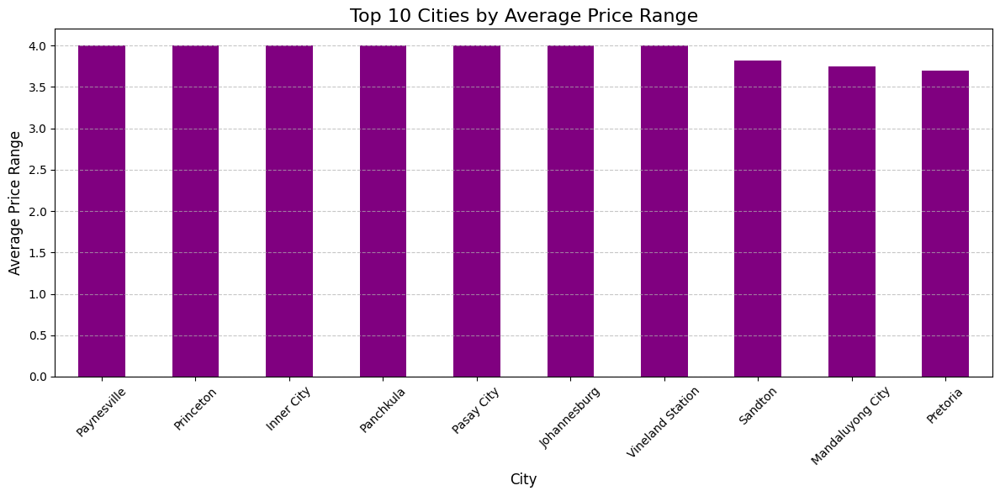

In [15]:
# Calculate the average price range by city
price_range_by_city = df.groupby('City')['Price range'].mean().sort_values(ascending=False)

# Select the top 10 cities with the highest average price range
top_price_range_cities = price_range_by_city.head(10)

# Create the barplot to visualize the top cities by average price range
plt.figure(figsize=(12, 6))
top_price_range_cities.plot(kind='bar', color='purple')
plt.title('Top 10 Cities by Average Price Range', fontsize=16)
plt.xlabel('City', fontsize=12)
plt.ylabel('Average Price Range', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [16]:
# Creating a density map using the latitude and longitude
from folium.plugins import HeatMap

heatmap_data = df[['Latitude', 'Longitude']].values.tolist()
heat_map = folium.Map(location=map_center, zoom_start=12)
HeatMap(heatmap_data).add_to(heat_map)
heat_map.save('restaurant_density_heatmap.html')


In [17]:
heat_map

In [18]:
# Calculating the number of restaurants in each city to determine the concentration

city_restaurant_count = df.groupby('City')['Latitude'].count().sort_values(ascending=False)
print(city_restaurant_count.head(10)) 

City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Lucknow           21
Ahmedabad         21
Guwahati          21
Amritsar          21
Name: Latitude, dtype: int64


In [19]:
# Filter the data for highly-rated restaurants (aggregate rating >= 4.5)

highly_rated = df[df['Aggregate rating'] >= 4.5]
print(highly_rated.head(10))

    Country Code              City   Longitude   Latitude  \
0            162       Makati City  121.027535  14.565443   
1            162       Makati City  121.014101  14.553708   
3            162  Mandaluyong City  121.056475  14.585318   
4            162  Mandaluyong City  121.057508  14.584450   
8            162        Pasay City  120.980090  14.552990   
9            162        Pasig City  121.056532  14.572041   
10           162        Pasig City  121.057916  14.567689   
12           162       Quezon City  121.075419  14.649503   
17           162     Tagaytay City  120.951589  14.101834   
18           162       Taguig City  121.045878  14.554360   

                      Cuisines  Price range  Aggregate rating  
0   French, Japanese, Desserts            3               4.8  
1                     Japanese            3               4.5  
3              Japanese, Sushi            4               4.9  
4             Japanese, Korean            4               4.8  
8      E

In [20]:
# Calculate the number of highly-rated restaurants in each city
top_highly_rated = highly_rated.groupby('City')['Latitude'].count().sort_values(ascending=False)
print(top_highly_rated.head(10))


City
New Delhi         28
London            15
Gurgaon           12
Rio de Janeiro    11
Tampa Bay         10
Auckland           9
Orlando            9
Bangalore          9
Dubai              9
Rest of Hawaii     8
Name: Latitude, dtype: int64


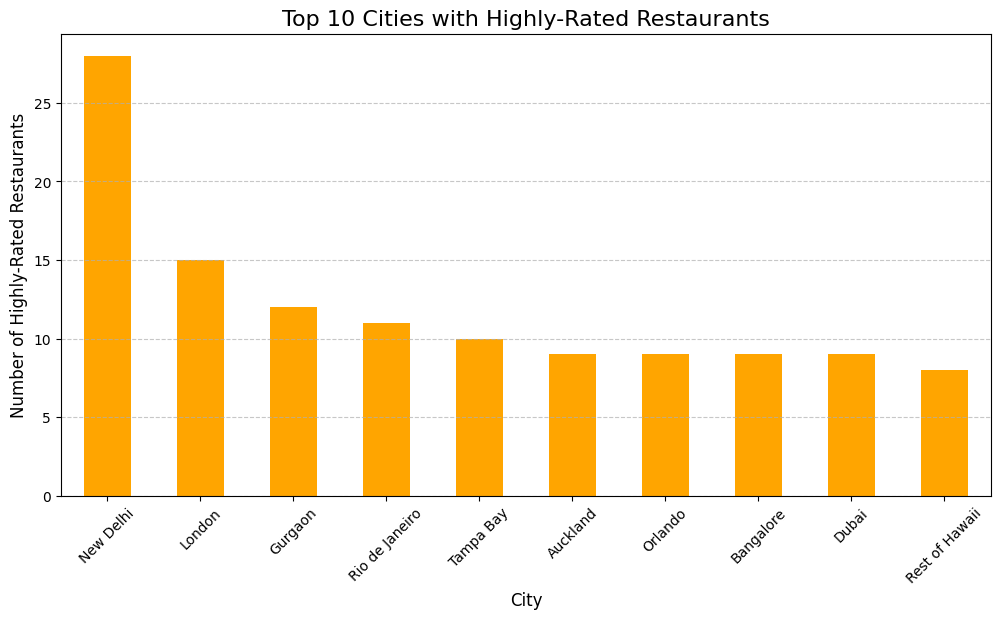

In [21]:
# Creating a barplot to visualize the top 10 cities with the highest number of highly-rated restaurants

top_highly_rated.head(10).plot(kind='bar', figsize=(12, 6), color='orange')
plt.title('Top 10 Cities with Highly-Rated Restaurants', fontsize=16)
plt.xlabel('City', fontsize=12)
plt.ylabel('Number of Highly-Rated Restaurants', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [22]:
# Initializing a new map
combined_map = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=12)

# Add restaurant density heatmap
HeatMap(df[['Latitude', 'Longitude']].values.tolist(), radius=8).add_to(combined_map)

# Add markers for highly-rated restaurants
for index, row in highly_rated.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['City']} - Rating: {row['Aggregate rating']}"
    ).add_to(combined_map)

combined_map.save('highly_rated_restaurant_clusters.html')


In [46]:
combined_map

## Insights from our analysis

## Top 10 Cities by Number of Restaurants

## Dominance of New Delhi
New Delhi has the highest number of restaurants, significantly more than any other city, with over 5000 restaurants. This indicates a thriving food culture and a high demand for dining options in the city.

## Leading Trio
Gurgaon and Noida follow New Delhi with around 1000 restaurants each. These three cities together dominate the top positions, showing that the National Capital Region (NCR) is a major hub for restaurants in India.

## Moderate Counts
Faridabad has the next highest count, but there is a considerable drop from the top three cities. This suggests a less dense but still notable restaurant presence in the city.

## Lower Counts
The remaining cities Ghaziabad, Bhubaneswar, Lucknow, Ahmedabad, Guwahati, and Amritsar have relatively low numbers of restaurants compared to the top cities. This might indicate either smaller populations or less developed dining cultures in these areas.

## Geographical Concentration
The chart highlights the concentration of restaurants in major cities, particularly in the northern part of India, with New Delhi leading the way by a large margin.

These insights can helps us identify trends and potential areas for restaurant business growth or improvement.


# Top 10 Cities by Average Rating

## High Ratings Across All Cities
All the cities in the chart have very high average ratings, close to 5. This suggests that these cities are highly regarded in the context of the ratings, possibly indicating excellent services or quality in whatever aspect the ratings are based on.

## Consistent Excellence
There is little variation in the average ratings across the top 10 cities, indicating a consistent level of high satisfaction or performance.

## Diverse Locations
The cities listed include a mix of locations from different regions, such as Quezon City, Makati City, Pasig City, Mandaluyong City, Beechworth, London, Taguig City, Lincoln, and Tagaytay City. This diversity suggests that high ratings are not confined to a specific region but are spread across various areas.

## Inner City Leading
Inner City is at the top of the chart with the highest average rating. This could be indicative of exceptional qualities or features that set it apart from the other cities.

These insights helps us identify patterns of excellence and areas where cities are excelling.


# Top 10 Cities by Number of Unique Cuisines

## New Delhi Leading in Culinary Diversity
New Delhi tops the chart with the highest number of unique cuisines. This indicates a vibrant and diverse food culture, offering a wide range of culinary experiences.

## Gurgaon and Noida
Gurgaon and Noida follow New Delhi, showcasing a significant variety of cuisines. This highlights the National Capital Region (NCR) as a major hub for diverse culinary options.

## Other Cities
Cities like Pretoria, Singapore, Abu Dhabi, Orlando, Mumbai and Augusta feature in the top 10, with a decent number of unique cuisines, reflecting a good mix of local and international culinary offerings emphasizing a global appeal and diverse culinary scenes.

These insights illustrate the culinary landscape across different cities and regions and highlight areas with diverse food cultures.


# Top 10 Cities by Average Price Range

## High Price Ranges
Most cities in the chart have an average price range of 4.0, indicating that they have higher price levels for the categories being considered. This could be relevant for economic or market analysis, as it suggests these cities are likely more expensive compared to others.

## Top Cities
Paynesville, Princeton, Inner City, Panchkula, Pasay City, Johannesburg, and Vineland Station all share the highest average price range of 4.0, showing that they lead in terms of price range within the data set.

## Slightly Lower Prices
Sandton, Mandaluyong City, and Pretoria have slightly lower average price ranges compared to the top cities. These differences, though subtle, could indicate slight variations in cost of living or price levels among these cities.

These insights help us highlight the cities with the highest average price ranges, which could be important for understanding economic conditions or making market-related decisions.

# Top 10 Cities with Highly-Rated Restaurants

## New Delhi Leads the Pack
New Delhi has the highest number of highly-rated restaurants, with approximately 27 establishments. This indicates a thriving restaurant scene with a focus on quality.

## London Follows
London comes in second with around 15 highly-rated restaurants, showcasing its reputation as a global culinary hub.

## Consistent Performers
Cities like Gurgaon, Rio de Janeiro and Tampa Bay, each have between 10 and 12 highly-rated restaurants. This consistency reflects a widespread appreciation for quality dining experiences in these locations.

## Fewer Highly-Rated Restaurants in Hawaii
Auckland, Orlando, Bangalore, Dubai and Rest of Hawaii has the fewest highly-rated restaurants among the top 10 cities, with around 9. This might suggest a smaller but still notable presence of top-tier dining options.

These insights highlight the cities with the most highly-rated restaurants, which can be valuable for food enthusiasts, travelers, and industry analysts.


# Key Insights from Heatmap Analysis

## Heatmap of India
### High-Density Areas:
- **New Delhi**: Highest restaurant density, showcasing a vibrant food culture.
- **Ahmedabad**: Similar intensity, reflecting a dense culinary scene.
- **Bengaluru**: Noticeable hotspots with bustling dining activity.
- **Kolkata**: Prominent regions with high restaurant density.

### Moderate-Density Areas:
- **Chennai**: Moderate activity compared to top cities.
- **Prayagraj**: Reflects moderate density and notable presence.

### Regional Patterns:
- High densities are concentrated in major metropolitan areas, with rural regions showing significantly lower activity.



## Heatmap of Southeast Asia and Oceania
### High-Density Areas:
- **Jakarta, Indonesia**: High density, highlighting a vibrant urban hub.
- **Singapore**: Significant hotspot, emphasizing its role as a regional hub.
- **Australia**: Extremely high concentrations in Melbourne and significantly high in Brisbane.


### Moderate-Density Areas:
- **Auckland, New Zealand**: Notable hotspot, reflecting significant activity.
- **Perth and Sydney, Australia**: Displays moderate density, indicating steady activity.
- **Pacific Islands** (Papua New Guinea, Solomon Islands, Vanuatu, Kiribati): Sparse but present activity.

### Regional Patterns:
- High activity in urban centers, with lower intensity in remote and less populous areas.



## Heatmap of Europe, North Africa, and the Middle East
### High-Density Areas:
- **London, UK**: Significant hotspot with concentrated activity.
- **Istanbul, Turkey**: Another prominent high-density region.
- **Southern Turkey (near Syria)**: Notable concentration, likely urban.
- **UAE**: Intense areas indicating key hubs like Dubai and Abu Dhabi.
- **Algiers, Algeria**: Dense activity around the capital.

### Regional Patterns:
- High densities around major urban centers, with rural areas showing significantly less intensity.



## Heatmap of Southern Africa
### High-Density Areas:
- **Cape Town, South Africa**: Blue hotspots highlighting vibrant activity.
- **Pretoria, South Africa**: Prominent region of high concentration.

### Regional Patterns:
- High activity focused on urban areas.



## Heatmap of North America
### High-Density Areas:
- **Seattle**: Significant hotspot in the Pacific Northwest.
- **Denver**: Intense activity around the Rocky Mountains.
- **Chicago**: High density in the Midwest.
- **Atlanta**: Southeastern hotspot with notable activity.
- **Hawaii**: Dense regions indicating high interest.

### Moderate-Density Areas:
- **Los Angeles**: Moderate intensity with steady activity.
- **Phoenix**: Displays significant yet lower activity.
- **New York/Washington, D.C.**: Yellow-green regions reflecting steady interest.
- **Toronto, Canada**: Comparable activity to major U.S. cities.

### Regional Patterns:
- High-density activity centered around metropolitan hubs, with rural areas showing minimal intensity.



## Heatmap of Brazil
### Moderate-Density Areas:
- **Brasília**: Significant activity around the capital.
- **São Paulo**: Major hotspot and activity hub.
- **Rio de Janeiro**: High density matching São Paulo's significance.


### Regional Patterns:
- Activity concentrated in major urban centers.


## Summary
These heatmap insights reveal consistent patterns of high activity in major metropolitan areas across regions, underscoring the role of urban centers as hubs for density and interest. Sparse activity in rural regions emphasizes the disparity in focus and development across geographies. These findings are instrumental for data-driven decision-making in various sectors like business expansion, urban planning, or market analysis.
